In [34]:
# pip install -U kaleido
# pip install --upgrade scikit-learn


In [35]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point, Polygon
from scipy.spatial import KDTree
import numpy as np

# Additional imports
import pystac_client
import xarray as xr
import pathlib
import os
import geopandas as gpd
import matplotlib as mpl
from matplotlib import colors
import rasterio

import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
from rasterio.plot import show

import matplotlib.colors as mcolors
from shapely.geometry import Point
import pandas as pd

from tqdm import tqdm

import webbrowser
from pathlib import Path
import os
import time

from itertools import compress
import pandas as pd

import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy
import plotly.graph_objects as go
import plotly.express as px
import plotly.io as pio

from tqdm import tqdm

from shapely.geometry import box



In [36]:
scenario="_2050_low_emission"
scenario_folder=r"\2050_Low_emission"
skip_land_sub=True
skip_TC=True
skip_EWH= True

extension=".csv"
Raw_File_Path=r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data_CVI_components\Caribbean Thesis_Results\Future Hazards\Raw Data\Caribbean_Hazards"+scenario+extension #Store Orig CSV
Classified_File_Path=r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data_CVI_components\Caribbean Thesis_Results\Future Hazards\Classified Data"+scenario+extension #Store Classified CSV

directory_path = r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data_CVI_components\Caribbean Thesis_Results\Caribbean Plots\Future Hazards"+scenario_folder #Image Storage
os.makedirs(directory_path, exist_ok=True)

In [37]:
template_df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\Arjen_Vector_Template.csv")
Hazard_map=template_df
Hazard_map = gpd.GeoDataFrame(
    Hazard_map, geometry=gpd.points_from_xy(Hazard_map.Intersect_lon, Hazard_map.Intersect_lat), crs="EPSG:4326"
)
Hazard_map=Hazard_map.drop(columns=["Start_lon","Start_lat","End_lon","End_lat","Intersect_lon","Intersect_lat"])
Hazard_map

,transect_id,country_id,continent,country_name,geometry
0,BOX_028_183_0,CHL,South America,Chile,POINT (-74.39097 -50.38256)
1,BOX_028_183_1,CHL,South America,Chile,POINT (-74.38713 -50.38404)
2,BOX_028_183_2,CHL,South America,Chile,POINT (-74.38328 -50.38553)
3,BOX_028_183_3,CHL,South America,Chile,POINT (-74.37952 -50.38708)
4,BOX_028_183_4,CHL,South America,Chile,POINT (-74.37599 -50.38885)
...,...,...,...,...,...
1739821,BOX_211_067_149,RUS,Europe,Russia,POINT (39.93520 64.69835)
1739822,BOX_211_067_150,RUS,Europe,Russia,POINT (39.93884 64.69947)
1739823,BOX_211_067_151,RUS,Europe,Russia,POINT (39.94200 64.70083)
1739824,BOX_211_067_152,RUS,Europe,Russia,POINT (39.94470 64.70236)


In [38]:
IPCC=gpd.read_file(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\All_Datasets\Orig_Datasets\04_Auxillary_files\IPCC-WGI-reference-regions-v4.gpkg")
IPCC.head()

,Continent,Type,Name,Acronym,geometry
0,POLAR,Land,Greenland/Iceland,GIC,"MULTIPOLYGON (((-10.00000 62.00000, -10.43750 ..."
1,NORTH-AMERICA,Land,N.W.North-America,NWN,"MULTIPOLYGON (((-105.00000 50.00000, -105.4386..."
2,NORTH-AMERICA,Land,N.E.North-America,NEN,"MULTIPOLYGON (((-50.00000 50.00000, -50.44000 ..."
3,NORTH-AMERICA,Land,W.North-America,WNA,"MULTIPOLYGON (((-130.00000 50.00000, -129.5614..."
4,NORTH-AMERICA,Land,C.North-America,CNA,"MULTIPOLYGON (((-90.00000 50.00000, -90.00000 ..."


In [39]:
region_acronym= "CAR"
region_gdf=IPCC.loc[IPCC["Acronym"]==region_acronym,:]
# region_gdf=region_gdf.iloc[:,-1:]
region_gdf


,Continent,Type,Name,Acronym,geometry
8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR,"MULTIPOLYGON (((-75.00000 12.00000, -75.32609 ..."


In [40]:
Hazard_map=Hazard_map.sjoin(region_gdf)
Hazard_map=Hazard_map.iloc[:,0:5]
Hazard_map.index=range(0,len(Hazard_map.index))
Hazard_map

,transect_id,country_id,continent,country_name,geometry
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068)
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731)
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314)
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877)
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440)
...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,POINT (-71.66819 17.96526)
37505,BOX_139_002_62,DOM,North America,Dominican Republic,POINT (-71.66623 17.96142)
37506,BOX_139_002_63,DOM,North America,Dominican Republic,POINT (-71.66458 17.95744)
37507,BOX_139_002_64,DOM,North America,Dominican Republic,POINT (-71.66294 17.95347)


Loading ESL- PC

In [41]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_Sea_level\Caribbean_ESL.csv")
df=df.drop(columns=['index_right'])
data_points = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Intersect_lon, df.Intersect_lat), crs="EPSG:4326"
)
data_points=data_points.sjoin(region_gdf)
print (data_points.columns)
data_points.index=range(0,len(data_points.index))
data_points

Index(['transect_id', 'country_id', 'continent', 'country_name', 'Start_lon',
       'Start_lat', 'Intersect_lon', 'Intersect_lat', 'End_lon', 'End_lat',
       'geometry', 'Continent_left', 'Type_left', 'Name_left', 'Acronym_left',
       'sampled points', 'ESL_RCP0.0_Time_Horizon2000',
       'ESL_RCP4.5_Time_Horizon2050', 'ESL_RCP4.5_Time_Horizon2100',
       'ESL_RCP8.5_Time_Horizon2050', 'ESL_RCP8.5_Time_Horizon2100',
       'index_right', 'Continent_right', 'Type_right', 'Name_right',
       'Acronym_right'],
      dtype='object')


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,...,ESL_RCP0.0_Time_Horizon2000,ESL_RCP4.5_Time_Horizon2050,ESL_RCP4.5_Time_Horizon2100,ESL_RCP8.5_Time_Horizon2050,ESL_RCP8.5_Time_Horizon2100,index_right,Continent_right,Type_right,Name_right,Acronym_right
0,BOX_116_353_2,COL,South America,Colombia,-71.874132,12.257491,-71.879805,12.250684,-71.885477,12.243877,...,0.946771,1.196450,1.524946,1.244471,1.867205,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
1,BOX_116_353_3,COL,South America,Colombia,-71.869660,12.252394,-71.876981,12.247308,-71.884303,12.242222,...,0.946771,1.196450,1.524946,1.244471,1.867205,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
2,BOX_116_353_4,COL,South America,Colombia,-71.866684,12.243923,-71.875632,12.243144,-71.884580,12.242366,...,0.946771,1.196450,1.524946,1.244471,1.867205,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
3,BOX_116_353_5,COL,South America,Colombia,-71.866286,12.239551,-71.875233,12.238772,-71.884181,12.237993,...,0.946771,1.196450,1.524946,1.244471,1.867205,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
4,BOX_116_353_6,COL,South America,Colombia,-71.865960,12.235759,-71.874835,12.234400,-71.883710,12.233041,...,0.946771,1.196450,1.524946,1.244471,1.867205,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,-71.660191,17.969154,-71.668186,17.965259,-71.676182,17.961363,...,1.246410,1.466509,1.830198,1.571873,2.158603,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37505,BOX_139_002_62,DOM,North America,Dominican Republic,-71.657870,17.964549,-71.666228,17.961418,-71.674587,17.958286,...,1.246410,1.466509,1.830198,1.571873,2.158603,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37506,BOX_139_002_63,DOM,North America,Dominican Republic,-71.656224,17.960573,-71.664583,17.957442,-71.672941,17.954311,...,1.246410,1.466509,1.830198,1.571873,2.158603,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37507,BOX_139_002_64,DOM,North America,Dominican Republic,-71.654578,17.956598,-71.662937,17.953466,-71.671295,17.950335,...,1.246410,1.466509,1.830198,1.571873,2.158603,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR


In [42]:
# Hazard_map["ESL_100yrRP"]=data_points["ESL_RCP0.0_Time_Horizon2000"]
Hazard_map_merged = pd.merge(left=Hazard_map, right=data_points, left_on="transect_id", right_on="transect_id")
Hazard_map["ESL_100yrRP_4.5_2050"]=Hazard_map_merged["ESL_RCP4.5_Time_Horizon2050"]
Hazard_map.head()

,transect_id,country_id,continent,country_name,geometry,ESL_100yrRP_4.5_2050
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068),1.19645
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731),1.19645
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314),1.19645
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877),1.19645
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440),1.19645


In [43]:
import plotly.express as px



lat = 18.1
lon = -77.3
view_width = 10

# # Filter dataframe within specified range
# filtered_df = df_final_merged[
#     (df_final_merged["Intersect_lon"] < lon + 18) & 
#     (df_final_merged["Intersect_lon"] > lon - 7.5) & 
#     (df_final_merged["Intersect_lat"] < lat + 9) & 
#     (df_final_merged["Intersect_lat"] > lat - 8)
# ]

# Plot using Plotly Express
fig = px.scatter_mapbox(Hazard_map,
                        lat=Hazard_map["geometry"].y,
                        lon=Hazard_map["geometry"].x,
                        color="ESL_100yrRP_4.5_2050",
                        hover_data="ESL_100yrRP_4.5_2050",
                        mapbox_style="carto-positron",width=2000,
                        height=1200)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=5.5),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline")
fig.show()

fig_name_shoreline=Hazard_map.columns[-1]+' shoreline_plot-RAW.png'
pio.write_image(fig, os.path.join(directory_path, fig_name_shoreline))

Loading Extreme Wave Height

In [44]:
# df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Extreme_wave_height\GCM Nearshore Mapping\Step 5- Calculating the RP at all global bias corrected GCM nodes-GEV_only\Global_Transects_GCM_FC_from_GCM_5yr100yr_RP_GEV_only.csv")
# # df=df.drop(columns=['index_right'])
# data_points = gpd.GeoDataFrame(
#     df, geometry=gpd.points_from_xy(df.Intersect_lon, df.Intersect_lat), crs="EPSG:4326"
# )
# data_points=data_points.sjoin(region_gdf)
# print (data_points.columns)
# data_points.index=range(0,len(data_points.index))
# data_points

In [45]:
# # Hazard_map["EWH_100yrRP"]=data_points["100_year_RP"]
# Hazard_map_merged = pd.merge(left=Hazard_map, right=data_points, left_on="transect_id", right_on="transect_id")
# Hazard_map["EWH_5_yr_RP 2050 SSP1-26 Ensemble mean"]=Hazard_map_merged["5_yr_RP 2050 SSP1-26 Ensemble mean"]
# Hazard_map.head()
Hazard_map["EWH_100yrRP"]=np.nan

In [46]:
# import plotly.express as px

# lat = 18.1
# lon = -77.3
# view_width = 10

# # # Filter dataframe within specified range
# # filtered_df = df_final_merged[
# #     (df_final_merged["Intersect_lon"] < lon + 18) & 
# #     (df_final_merged["Intersect_lon"] > lon - 7.5) & 
# #     (df_final_merged["Intersect_lat"] < lat + 9) & 
# #     (df_final_merged["Intersect_lat"] > lat - 8)
# # ]

# # Plot using Plotly Express
# fig = px.scatter_mapbox(Hazard_map,
#                         lat=Hazard_map["geometry"].y,
#                         lon=Hazard_map["geometry"].x,
#                         color="EWH_5_yr_RP 2050 SSP1-26 Ensemble mean",
#                         hover_data="EWH_5_yr_RP 2050 SSP1-26 Ensemble mean",
#                         mapbox_style="carto-positron",width=2000,
#                         height=1200)

# # Update map layout to adjust center and zoom
# fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=5.5),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline")
# fig.show()

# fig_name_shoreline=Hazard_map.columns[-1]+' shoreline_plot-RAW.png'
# pio.write_image(fig, os.path.join(directory_path, fig_name_shoreline))

Land Subsidence

In [47]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Land_Subsidence\caribbean_land_sub_2km_2040.csv")
df=df.drop(columns=['index_right'])
data_points = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.Intersect_lon, df.Intersect_lat), crs="EPSG:4326"
)
data_points=data_points.sjoin(region_gdf)
print (data_points.columns)
data_points.index=range(0,len(data_points.index))
data_points

Index(['transect_id', 'country_id', 'continent', 'country_name', 'Start_lon',
       'Start_lat', 'Intersect_lon', 'Intersect_lat', 'End_lon', 'End_lat',
       'geometry', 'Continent_left', 'Type_left', 'Name_left', 'Acronym_left',
       'Tile_name', 'Land_sub', 'index_right', 'Continent_right', 'Type_right',
       'Name_right', 'Acronym_right'],
      dtype='object')


,transect_id,country_id,continent,country_name,Start_lon,Start_lat,Intersect_lon,Intersect_lat,End_lon,End_lat,...,Type_left,Name_left,Acronym_left,Tile_name,Land_sub,index_right,Continent_right,Type_right,Name_right,Acronym_right
0,BOX_117_218_83,BRB,North America,Barbados,-59.579018,13.283934,-59.570669,13.287160,-59.562319,13.290386,...,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
1,BOX_117_218_89,BRB,North America,Barbados,-59.590879,13.304903,-59.583584,13.310003,-59.576288,13.315104,...,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
2,BOX_117_218_88,BRB,North America,Barbados,-59.588258,13.301353,-59.580963,13.306454,-59.573667,13.311554,...,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
3,BOX_117_218_87,BRB,North America,Barbados,-59.585637,13.297803,-59.578342,13.302904,-59.571047,13.308005,...,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
4,BOX_117_218_86,BRB,North America,Barbados,-59.583859,13.294961,-59.575994,13.299186,-59.568130,13.303411,...,Land-Ocean,Caribbean,CAR,B01_x-60.0_y11.0,NaN,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_138_080_23,CUB,North America,Cuba,-84.330784,22.112429,-84.339724,22.113245,-84.348664,22.114062,...,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,3.0,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37505,BOX_138_080_22,CUB,North America,Cuba,-84.330359,22.118191,-84.339300,22.117387,-84.348241,22.116583,...,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,3.0,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37506,BOX_138_080_21,CUB,North America,Cuba,-84.331355,22.124170,-84.339864,22.121502,-84.348373,22.118834,...,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37507,BOX_138_080_33,CUB,North America,Cuba,-84.326943,22.093661,-84.330312,22.085945,-84.333681,22.078228,...,Land-Ocean,Caribbean,CAR,B01_x-87.0_y20.0,4.0,8,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR


In [48]:
Hazard_map_merged = pd.merge(left=Hazard_map, right=data_points, left_on="transect_id", right_on="transect_id")
Hazard_map["Land_Subsidence_2040_high"]=Hazard_map_merged["Land_sub"]
Hazard_map.head()

,transect_id,country_id,continent,country_name,geometry,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068),1.19645,NaN,3.0
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731),1.19645,NaN,3.0
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314),1.19645,NaN,3.0
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877),1.19645,NaN,3.0
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440),1.19645,NaN,3.0


In [49]:
import plotly.express as px


# Define your discrete color scale
color_scale = ['#D9EAD3', '#A9D08E', '#F9D670', '#FFA94D', '#FF704D', '#FF4D4D']
lat = 18.1
lon = -77.3
view_width = 10

# # Filter dataframe within specified range
# filtered_df = df_final_merged[
#     (df_final_merged["Intersect_lon"] < lon + 18) & 
#     (df_final_merged["Intersect_lon"] > lon - 7.5) & 
#     (df_final_merged["Intersect_lat"] < lat + 9) & 
#     (df_final_merged["Intersect_lat"] > lat - 8)
# ]

# Plot using Plotly Express
fig = px.scatter_mapbox(Hazard_map,
                        lat=Hazard_map["geometry"].y,
                        lon=Hazard_map["geometry"].x,
                        color="Land_Subsidence_2040_high",
                        hover_data="Land_Subsidence_2040_high",             
                        mapbox_style="carto-positron",width=2000,
                        height=1200)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=5.5),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline")
fig.show()

fig_name_shoreline=Hazard_map.columns[-1]+' shoreline_plot-RAW.png'
pio.write_image(fig, os.path.join(directory_path, fig_name_shoreline))

In [50]:
import plotly.express as px

long_name="Land_Subsidence_2040_high"
second_name="Land_Sub_Risk_Level"
label_dict = {
    1: "Very Low",
    2: "Low",
    3: "Medium",
    4: "High",
    5: "Very High",
    6: "Extremely High"
}
colors = {'Very Low': '#D9EAD3', 'Low': '#A9D08E', 'Medium': '#F9D670', 'High': '#FFA94D', 'Very High': '#FF704D','Extremely High': '#FF4D4D'}


Hazard_map[second_name] = Hazard_map[long_name].replace(label_dict)
# Hazard_map["color"] = Hazard_map[second_name].replace(colors)

# Create scatter map plot
fig = px.scatter_mapbox(Hazard_map,
                        lat=Hazard_map["geometry"].y,
                        lon=Hazard_map["geometry"].x,
                        hover_name=second_name,
                        color=second_name,
                        color_discrete_map=colors,
                        mapbox_style="carto-positron",width=1000,
                        height=600)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=4),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline")
fig.show()

In [51]:
Hazard_map=Hazard_map.drop(columns="Land_Sub_Risk_Level")
Hazard_map

,transect_id,country_id,continent,country_name,geometry,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068),1.196450,NaN,3.0
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731),1.196450,NaN,3.0
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314),1.196450,NaN,3.0
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877),1.196450,NaN,3.0
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440),1.196450,NaN,3.0
...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,POINT (-71.66819 17.96526),1.466509,NaN,2.0
37505,BOX_139_002_62,DOM,North America,Dominican Republic,POINT (-71.66623 17.96142),1.466509,NaN,2.0
37506,BOX_139_002_63,DOM,North America,Dominican Republic,POINT (-71.66458 17.95744),1.466509,NaN,2.0
37507,BOX_139_002_64,DOM,North America,Dominican Republic,POINT (-71.66294 17.95347),1.466509,NaN,2.0


Loading Global Erosion_Rates

In [52]:
df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\02_Future\Shoreline_Change\Global_Erosion_rate_FC_shore_mon_fut_start_to_intersect.csv")
# df=df.drop(columns=['index_right'])
data_points = gpd.GeoDataFrame(
    df, geometry=gpd.points_from_xy(df.lon, df.lat), crs="EPSG:4326"
)
data_points=data_points.sjoin(region_gdf)
print (data_points.columns)
data_points.index=range(0,len(data_points.index))
data_points = data_points.drop_duplicates(subset='transect_id', keep='first')
data_points=data_points.drop(columns="index_right")
# data_points["transect_id"] = data_points["transect_id"].apply(lambda x: x.replace("b'","").replace("'",""))
# data_points["country"] =data_points["country"].apply(lambda x: x.replace("b'","").replace("'",""))
data_points

Index(['transect_id', 'country_id_x', 'continent_x', 'country_name',
       'geometry', 'changerate', 'continent_y', 'country', 'country_id_y',
       'intercept', 'lat', 'lon', 'transect_geom', 'Change_rate_SSP1_45_2050',
       'Change_rate_SSP1_45_2100', 'Change_rate_SSP5_85_2050',
       'Change_rate_SSP5_85_2100', 'index_right', 'Continent', 'Type', 'Name',
       'Acronym'],
      dtype='object')


,transect_id,country_id_x,continent_x,country_name,geometry,changerate,continent_y,country,country_id_y,intercept,...,lon,transect_geom,Change_rate_SSP1_45_2050,Change_rate_SSP1_45_2100,Change_rate_SSP5_85_2050,Change_rate_SSP5_85_2100,Continent,Type,Name,Acronym
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068),NaN,NaN,NaN,NaN,NaN,...,-71.879805,NaN,NaN,NaN,NaN,NaN,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731),NaN,NaN,NaN,NaN,NaN,...,-71.876981,NaN,NaN,NaN,NaN,NaN,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314),NaN,NaN,NaN,NaN,NaN,...,-71.875632,NaN,NaN,NaN,NaN,NaN,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877),NaN,NaN,NaN,NaN,NaN,...,-71.875233,NaN,NaN,NaN,NaN,NaN,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440),NaN,NaN,NaN,NaN,NaN,...,-71.874835,NaN,NaN,NaN,NaN,NaN,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,POINT (-71.66819 17.96526),0.288753,b'North America',Dominican Republic,b'DOM',892.636242,...,-71.668186,"b'LINESTRING (-71.6601908294 17.9691544308, -7...",0.255533,0.261496,0.247684,0.245955,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37505,BOX_139_002_62,DOM,North America,Dominican Republic,POINT (-71.66623 17.96142),0.166001,b'North America',Dominican Republic,b'DOM',887.783993,...,-71.666228,"b'LINESTRING (-71.6578700793 17.9645487929, -7...",0.132781,0.138744,0.124932,0.123203,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37506,BOX_139_002_63,DOM,North America,Dominican Republic,POINT (-71.66458 17.95744),0.092415,b'North America',Dominican Republic,b'DOM',931.399153,...,-71.664583,"b'LINESTRING (-71.6562242238 17.9605733279, -7...",0.059195,0.065159,0.051347,0.049618,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR
37507,BOX_139_002_64,DOM,North America,Dominican Republic,POINT (-71.66294 17.95347),-0.027472,b'North America',Dominican Republic,b'DOM',1061.648069,...,-71.662937,"b'LINESTRING (-71.6545783683 17.9565977736, -7...",-0.060692,-0.054729,-0.068541,-0.070270,CENTRAL-AMERICA,Land-Ocean,Caribbean,CAR


In [53]:

Hazard_map["Change_rate_SSP1_45_2050"]=data_points["Change_rate_SSP1_45_2050"]
Hazard_map.head()


,transect_id,country_id,continent,country_name,geometry,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high,Change_rate_SSP1_45_2050
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.87980 12.25068),1.19645,NaN,3.0,NaN
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698 12.24731),1.19645,NaN,3.0,NaN
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.87563 12.24314),1.19645,NaN,3.0,NaN
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.87523 12.23877),1.19645,NaN,3.0,NaN
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.87483 12.23440),1.19645,NaN,3.0,NaN


In [54]:
import plotly.express as px

lat = 18.1
lon = -77.3
view_width = 10

# # Filter dataframe within specified range
# filtered_df = df_final_merged[
#     (df_final_merged["Intersect_lon"] < lon + 18) & 
#     (df_final_merged["Intersect_lon"] > lon - 7.5) & 
#     (df_final_merged["Intersect_lat"] < lat + 9) & 
#     (df_final_merged["Intersect_lat"] > lat - 8)
# ]

nonan=Hazard_map[~Hazard_map["Change_rate_SSP1_45_2050"].isna()]
# nonan=Hazard_map
# Plot using Plotly Express
fig = px.scatter_mapbox(nonan,
                        lat=nonan["geometry"].y,
                        lon=nonan["geometry"].x,
                        color="Change_rate_SSP1_45_2050",
                        range_color=(-2, 0.5),
                        hover_data="transect_id",
                        mapbox_style="carto-positron",width=2000,
                        height=1200)

# Update map layout to adjust center and zoom
fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=5.5),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline")
fig.show()

fig_name_shoreline=Hazard_map.columns[-1]+' shoreline_plot-RAW.png'
pio.write_image(fig, os.path.join(directory_path, fig_name_shoreline))

Loading Cat3 Tropical cyclone RP year

In [55]:
# df=pd.read_csv(r"P:\11209197-018-global-coastal-atlas\MSc_students\ClenmarRowe\Data\Processed_data\01_Hazards\01_Present\Extreme_Tropical_Cyclone_Wind\Caribbean_Cat3_Cyclones.csv")
# # df=df.drop(columns=['index_right'])
# data_points = gpd.GeoDataFrame(
#     df, geometry=gpd.points_from_xy(df.Intersect_lon, df.Intersect_lat), crs="EPSG:4326"
# )
# # data_points=data_points.sjoin(region_gdf)
# # print (data_points.columns)
# # data_points.index=range(0,len(data_points.index))
# data_points

In [56]:
# # Hazard_map["Shoreline_Change_Rate_PC"]=data_points["Shoreline_Change_Rate"]
# Hazard_map_merged = pd.merge(left=Hazard_map, right=data_points, left_on="transect_id", right_on="transect_id")
# Hazard_map["Cat3_TC_Return_Period_FC_2050_8_5"]=Hazard_map_merged["TC_RP_map_96kts_FC_2050_RCP85"]
# Hazard_map.head()
Hazard_map["Cat3_TC_Return_Period_FC_2050_8_5"]=np.nan


In [57]:
# import plotly.express as px

# lat = 18.1
# lon = -77.3
# view_width = 10



# # Plot using Plotly Express
# fig = px.scatter_mapbox(Hazard_map,
#                         lat=Hazard_map["geometry"].y,
#                         lon=Hazard_map["geometry"].x,
#                         color="Cat3_TC_Return_Period_FC_2050_8_5",
#                         # range_color=(-2, 0.5),
#                         hover_data="Cat3_TC_Return_Period_FC_2050_8_5",
#                         mapbox_style="carto-positron",width=2000,
#                         height=1200)

# # Update map layout to adjust center and zoom
# fig.update_layout(mapbox=dict(center=dict(lat=lat+1, lon=lon+4), zoom=5.2),title=f"{Hazard_map.columns[-1]} Distribution along Caribbean's shoreline",    
#                   margin=dict(
#                     l=50, # left margin
#                     r=0, # right margin
#                     t=50, # top margin
#                     b=50 # bottom margin
#     )
# )


# fig.show()

# fig_name_shoreline=Hazard_map.columns[-1]+' shoreline_plot-RAW.png'
# pio.write_image(fig, os.path.join(directory_path, fig_name_shoreline))

Saving Final raw Hazard indicator Values

In [58]:

Hazard_map.to_csv(Raw_File_Path,index=False)


## Now We do the Clustering
#### Remember to save the upper limits of each to a CSV

In [59]:
# Read the CSV file into a DataFrame
circle_center_df = pd.read_csv(Raw_File_Path)
circle_center_df



,transect_id,country_id,continent,country_name,geometry,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high,Change_rate_SSP1_45_2050,Cat3_TC_Return_Period_FC_2050_8_5
0,BOX_116_353_2,COL,South America,Colombia,POINT (-71.8798045985 12.250683718),1.196450,NaN,3.0,NaN,NaN
1,BOX_116_353_3,COL,South America,Colombia,POINT (-71.87698143850001 12.247308305),1.196450,NaN,3.0,NaN,NaN
2,BOX_116_353_4,COL,South America,Colombia,POINT (-71.8756318462 12.2431443263),1.196450,NaN,3.0,NaN,NaN
3,BOX_116_353_5,COL,South America,Colombia,POINT (-71.8752334021 12.2387721729),1.196450,NaN,3.0,NaN,NaN
4,BOX_116_353_6,COL,South America,Colombia,POINT (-71.8748349513 12.2343999454),1.196450,NaN,3.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,POINT (-71.6681862112 17.9652589019),1.466509,NaN,2.0,0.255533,NaN
37505,BOX_139_002_62,DOM,North America,Dominican Republic,POINT (-71.6662284163 17.9614175026),1.466509,NaN,2.0,0.132781,NaN
37506,BOX_139_002_63,DOM,North America,Dominican Republic,POINT (-71.664582619 17.9574419454),1.466509,NaN,2.0,0.059195,NaN
37507,BOX_139_002_64,DOM,North America,Dominican Republic,POINT (-71.6629367897 17.953466310899998),1.466509,NaN,2.0,-0.060692,NaN


In [60]:

# Identify the correct geometry column (replace 'geometry_column_name' with the actual column name)
geometry_column_name = 'geometry'
circle_center_df['x'] = circle_center_df[geometry_column_name].apply(lambda point_str: float(point_str.strip('POINT ()').split()[0]))
circle_center_df['y'] = circle_center_df[geometry_column_name].apply(lambda point_str: float(point_str.strip('POINT ()').split()[1]))

circle_center_df = circle_center_df.drop(columns=[geometry_column_name])

# Create the GeoDataFrame with the correct geometry column
circle_center = gpd.GeoDataFrame(circle_center_df, geometry=gpd.points_from_xy(circle_center_df.x, circle_center_df.y))



# Slice the DataFrame to exclude 'geometry', 'x', and 'y' columns
other_columns = circle_center.iloc[:, 0:-3]

# Concatenate the 'geometry' column with the other columns
circle_center2 = gpd.GeoDataFrame(geometry=circle_center.geometry, data=other_columns)


circle_center=circle_center2
circle_center

,transect_id,country_id,continent,country_name,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high,Change_rate_SSP1_45_2050,Cat3_TC_Return_Period_FC_2050_8_5,geometry
0,BOX_116_353_2,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87980 12.25068)
1,BOX_116_353_3,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87698 12.24731)
2,BOX_116_353_4,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87563 12.24314)
3,BOX_116_353_5,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87523 12.23877)
4,BOX_116_353_6,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87483 12.23440)
...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.255533,NaN,POINT (-71.66819 17.96526)
37505,BOX_139_002_62,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.132781,NaN,POINT (-71.66623 17.96142)
37506,BOX_139_002_63,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.059195,NaN,POINT (-71.66458 17.95744)
37507,BOX_139_002_64,DOM,North America,Dominican Republic,1.466509,NaN,2.0,-0.060692,NaN,POINT (-71.66294 17.95347)


In [61]:
isinstance(circle_center, gpd.GeoDataFrame)

True

In [62]:
img_lat = 18.1
img_lon = -77.3
view_width = 10

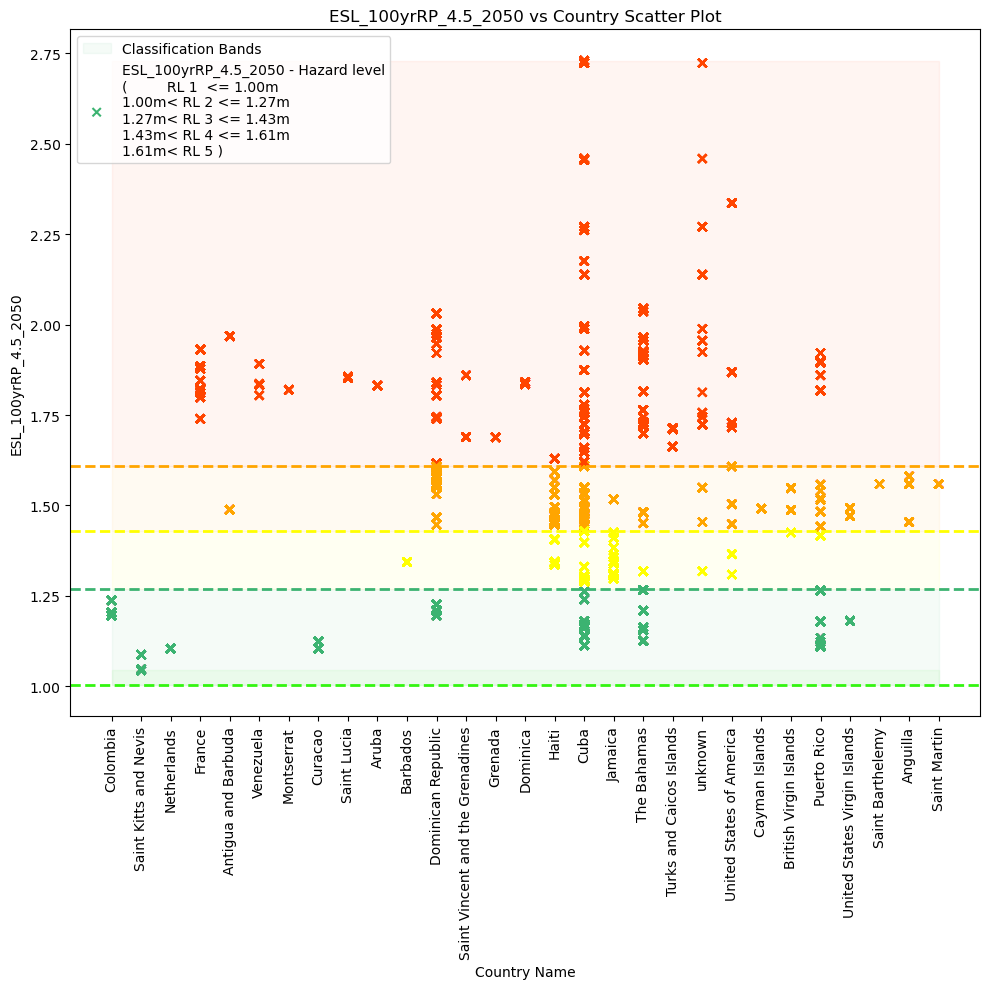

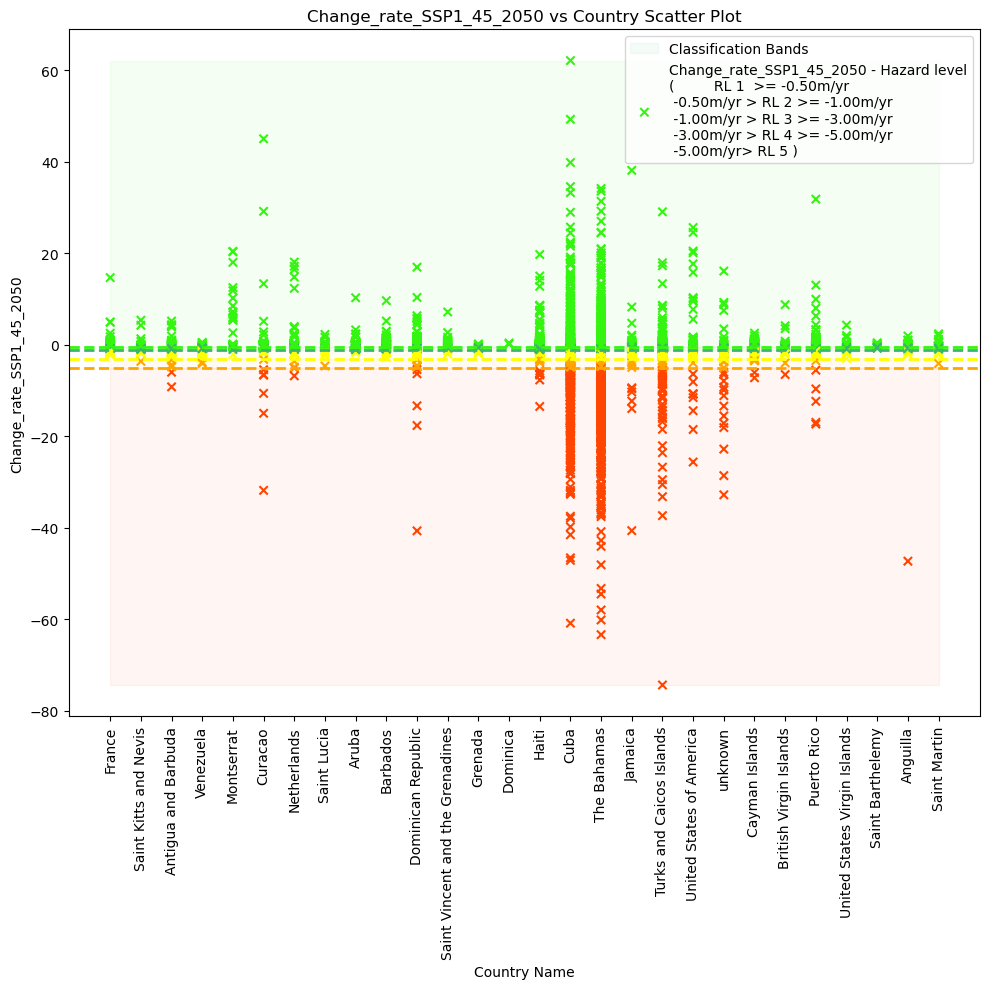

In [63]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import numpy as np

circle_center_final_export=circle_center

Future=True

# # in the case of *DIRECTLY* proportional variable increase to proportional exposure level increase
# #eg wave heaight higher Hs the Higher the risk


# in the case of *INVERSELY *proportional variable increase to proportional exposure level increase
#eg Nearshore slope : higher tanB(m) the lower the risk
inverse_map=[False,False,False,True,True]
predifined_map=[False,False,False,True,False]
units=["m","m","","m/yr","years"]
short_name= ["ESL_100yrRP","EWH_100yrRP","Land_Subsidence_2010","Shoreline_Change_Rate_PC","Cat3_TC_Return_Period_FC_2050_8_5"]
abbreviation=["ESL","EWH","Land_Sub","Erosion", "TC"]
short_name=list(circle_center.columns[4:9])


for i,col_num in enumerate(range(4,9)):
    # col_num=2
    if skip_land_sub:
          if abbreviation[i]=="Land_Sub":
                continue
    if skip_TC:
        if  "TC" in abbreviation[i]:
            continue
    
    if skip_EWH:
        if  "EWH" in abbreviation[i]:
            continue    

    distance_Exposure = pd.concat([pd.DataFrame(circle_center.index),circle_center.iloc[:, col_num]], axis=1) #Check grouping by country soon circle_center.iloc[:, 3]
    distance_Exposure = pd.concat([circle_center.iloc[:, 3],circle_center.iloc[:, col_num]], axis=1) #Check grouping by country soon circle_center.iloc[:, 3]

    # Slice the DataFrame to exclude 'geometry', 'x', and 'y' columns
    other_columns = distance_Exposure 

    # Concatenate the 'geometry' column with the other columns
    circle_center_nans = gpd.GeoDataFrame(geometry=circle_center.geometry, data=other_columns)


    #STEP 2 KMEANS CLUSTERING

    inverse=inverse_map[i]
    predifined=predifined_map[i]
    unit=units[i]


    color_scale = ['#33f510','#3CB371','#FFFF00', '#FFA500','#FF4500']


    # Create a new DataFrame without NaNs (for clustering) Because Kmeans Cannot compute NaNs
    circle_center_nans = circle_center_nans.dropna().copy()

    if len(circle_center_nans.iloc[:,0])==0:
        print("no points for " + short_name[i])
        continue
        
    long_name=short_name[i]+ " - Hazard level"
    circle_center_nans[long_name] = 0





    ######################################################
    # Notation for Risk level Classes
    #####################################################


    #######################################################################
    # IF FUTURE USE FIXED CLASSIFICATION
    ########################################################################
    
    if Future:
        if "ESL" in abbreviation[i]:
                    RL1=1.04
                    RL2=1.27
                    RL3=1.43
                    RL4=1.61

                
                    circle_center_nans.loc[circle_center_nans[short_name[i]] <= RL1, long_name] = 1
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL1) & (circle_center_nans[short_name[i]] <= RL2), long_name] = 2
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL2) & (circle_center_nans[short_name[i]] <= RL3), long_name] = 3
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL3) & (circle_center_nans[short_name[i]] <= RL4), long_name] = 4
                    circle_center_nans.loc[circle_center_nans[short_name[i]] > RL4, long_name] = 5
                    # RL5=circle_center_nans[circle_center_nans[long_name]==5].loc[:,short_name[i]].values.max() #Plotting purposes only


                    class_text = f"(         RL 1  <= {RL1:.2f}{unit} \n{RL1:.2f}{unit}< RL 2 <= {RL2:.2f}{unit} \n{RL2:.2f}{unit}< RL 3 <= {RL3:.2f}{unit} \n{RL3:.2f}{unit}< RL 4 <= {RL4:.2f}{unit} \n{RL4:.2f}{unit}< RL 5 )"


        if "EWH" in abbreviation[i]:
                    RL1=6.27
                    RL2=8.01
                    RL3=11.24
                    RL4=13.84

                
                    circle_center_nans.loc[circle_center_nans[short_name[i]] <= RL1, long_name] = 1
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL1) & (circle_center_nans[short_name[i]] <= RL2), long_name] = 2
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL2) & (circle_center_nans[short_name[i]] <= RL3), long_name] = 3
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL3) & (circle_center_nans[short_name[i]] <= RL4), long_name] = 4
                    circle_center_nans.loc[circle_center_nans[short_name[i]] > RL4, long_name] = 5
                    # RL5=circle_center_nans[circle_center_nans[long_name]==5].loc[:,short_name[i]].values.max() #Plotting purposes only

                    class_text = f"(         RL 1  <= {RL1:.2f}{unit} \n{RL1:.2f}{unit}< RL 2 <= {RL2:.2f}{unit} \n{RL2:.2f}{unit}< RL 3 <= {RL3:.2f}{unit} \n{RL3:.2f}{unit}< RL 4 <= {RL4:.2f}{unit} \n{RL4:.2f}{unit}< RL 5 )"
    
        if "Land_Sub" in abbreviation[i]:
                    RL1=1
                    RL2=2
                    RL3=3
                    RL4=4

                
                    circle_center_nans.loc[circle_center_nans[short_name[i]] <= RL1, long_name] = 1
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL1) & (circle_center_nans[short_name[i]] <= RL2), long_name] = 2
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL2) & (circle_center_nans[short_name[i]] <= RL3), long_name] = 3
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] > RL3) & (circle_center_nans[short_name[i]] <= RL4), long_name] = 4
                    circle_center_nans.loc[circle_center_nans[short_name[i]] > RL4, long_name] = 5
                    # RL5=circle_center_nans[circle_center_nans[long_name]==5].loc[:,short_name[i]].values.max() #Plotting purposes only

                    class_text = f"(         RL 1  <= {RL1:.2f}{unit} \n{RL1:.2f}{unit}< RL 2 <= {RL2:.2f}{unit} \n{RL2:.2f}{unit}< RL 3 <= {RL3:.2f}{unit} \n{RL3:.2f}{unit}< RL 4 <= {RL4:.2f}{unit} \n{RL4:.2f}{unit}< RL 5 )"

        if "Erosion" in abbreviation[i]:
                    RL0=10
                    RL1=-0.5
                    RL2=-1
                    RL3=-3
                    RL4=-5
                    RL5=-10
                
                    circle_center_nans.loc[circle_center_nans[short_name[i]] >= RL1, long_name] = 1
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL1) & (circle_center_nans[short_name[i]] >= RL2), long_name] = 2
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL2) & (circle_center_nans[short_name[i]] >= RL3), long_name] = 3
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL3) & (circle_center_nans[short_name[i]] >= RL4), long_name] = 4
                    circle_center_nans.loc[circle_center_nans[short_name[i]] < RL4, long_name] = 5

                    class_text=f"(         RL 1  >= {RL1:.2f}{unit} \n {RL1:.2f}{unit} > RL 2 >= {RL2:.2f}{unit} \n {RL2:.2f}{unit} > RL 3 >= {RL3:.2f}{unit} \n {RL3:.2f}{unit} > RL 4 >= {RL4:.2f}{unit} \n {RL4:.2f}{unit}> RL 5 )"
    
        if "TC" in abbreviation[i]:
                    # RL0=10
                    RL1=9.01
                    RL2=7.09
                    RL3=6.10
                    RL4=5.59
                    # RL5=-10
                
                    circle_center_nans.loc[circle_center_nans[short_name[i]] >= RL1, long_name] = 1
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL1) & (circle_center_nans[short_name[i]] >= RL2), long_name] = 2
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL2) & (circle_center_nans[short_name[i]] >= RL3), long_name] = 3
                    circle_center_nans.loc[(circle_center_nans[short_name[i]] < RL3) & (circle_center_nans[short_name[i]] >= RL4), long_name] = 4
                    circle_center_nans.loc[circle_center_nans[short_name[i]] < RL4, long_name] = 5

                    class_text=f"(         RL 1  >= {RL1:.2f}{unit} \n {RL1:.2f}{unit} > RL 2 >= {RL2:.2f}{unit} \n {RL2:.2f}{unit} > RL 3 >= {RL3:.2f}{unit} \n {RL3:.2f}{unit} > RL 4 >= {RL4:.2f}{unit} \n {RL4:.2f}{unit}> RL 5 )"
    
        if inverse:
            try:
                RL0=circle_center_nans.loc[:,short_name[i]].values.max()
            except ValueError as e:
                if "zero-size array to reduction" in str(e):
                    RL0 = RL1 +5
            try:
                RL5=circle_center_nans.loc[:,short_name[i]].values.min()
            except ValueError as e:
                if "zero-size array to reduction" in str(e):
                    RL5 = RL4 -5

        if not inverse:

            try:
                RL0=circle_center_nans.loc[:,short_name[i]].values.min()
            except ValueError as e:
                if "zero-size array to reduction" in str(e):
                    RL0 = RL1 -5
            try:
                RL5=circle_center_nans.loc[:,short_name[i]].values.max()
            except ValueError as e:
                if "zero-size array to reduction" in str(e):
                    RL5 = RL4 +5



    #Plot the cluster distribution scatter plot
    plt.figure(figsize=(10, 10))

    point_colors = [color_scale[label] for label in circle_center_nans[long_name]-1]

    ############
    # Plot Risk Level Separators fill between
    ############
    hue=color_scale
    # if inverse:
    #     hue=color_scale[::-1]

    
    plt.axhline(RL1, color=hue[0], linestyle='--',linewidth=2)
    plt.axhline(RL2, color=hue[1], linestyle='--',linewidth=2)
    plt.axhline(RL3, color=hue[2], linestyle='--',linewidth=2)
    plt.axhline(RL4, color=hue[3], linestyle='--',linewidth=2)

    alpha=0.05
    plt.fill_between(circle_center_nans.iloc[:, 0].unique(),y1=RL0,y2= RL1, color=hue[0], alpha=alpha)
    plt.fill_between(circle_center_nans.iloc[:, 0].unique(),y1=RL1,y2= RL2, color=hue[1], alpha=alpha,label='Classification Bands')
    plt.fill_between(circle_center_nans.iloc[:, 0].unique(),y1=RL2,y2= RL3, color=hue[2], alpha=alpha)
    plt.fill_between(circle_center_nans.iloc[:, 0].unique(),y1=RL3, y2=RL4, color=hue[3], alpha=alpha)
    plt.fill_between(circle_center_nans.iloc[:, 0].unique(),y1=RL4,y2= RL5, color=hue[4], alpha=alpha)
    
  



    # Plot original data points with custom colors
    plt.scatter(circle_center_nans.iloc[:, 0], circle_center_nans.iloc[:, 1], c=point_colors, marker='x', label=long_name +f"\n{class_text}")

    # Plot cluster centroids
    # plt.scatter((circle_center_nans.iloc[-1, 0]/2)*(kmeans.cluster_centers_[:, 0]/kmeans.cluster_centers_[:, 0]), kmeans.cluster_centers_[:, 0], s=120, c='red', marker='o', label='Cluster Centroids')


    # Plot cluster centroids by country
    # plt.scatter([circle_center_nans.iloc[len(circle_center_nans.index)//2,0]]*len(kmeans.cluster_centers_), kmeans.cluster_centers_[:, 0], s=120, c='red', marker='o', label='Cluster Centroids')

    # Add labels and legend
    plt.xlabel('Country Name')
    plt.ylabel(short_name[i])
    plt.title(short_name[i]+' vs Country Scatter Plot')
    plt.legend()

    # Rotate x-axis labels
    plt.xticks(rotation=90)
    if short_name[i]=="Shoreline_Change_Rate_PC":
        plt.ylim(-10,10)

    # Adjust layout
    plt.tight_layout()
    # plt.show()
  
    fig_name_scatter=short_name[i]+' cluster_class_plot.png'
    plt.savefig(os.path.join(directory_path, fig_name_scatter)) 

   
    # plt.close()


    #Create GPD circle_center_final with all the information of the different exposure levels
    circle_center_final=circle_center
    circle_center_final = circle_center_final.merge(circle_center_nans[['geometry', long_name]], on='geometry', how='left')
    circle_center_final


##################################################################################################
# Caribbean zoom
##################################################################################################
    Risk_level_name= long_name + " name"
    # color_scale = ['#33f510','#3CB371','#FFFF00', '#FFA500','#FF4500']
    label_dict = {
    1: "Very Low",
    2: "Low",
    3: "Medium",
    4: "High",
    5: "Very High"}

    colors = {'Very Low': '#33f510', 'Low': '#3CB371', 'Medium': '#FFFF00', 'High': '#FFA500', 'Very High': '#FF4500'}

   

    sorted_CCN=circle_center_final.sort_values(long_name)
    # Create scatter map plot
    fig_region = px.scatter_mapbox(sorted_CCN,
                            lat=sorted_CCN["geometry"].y,
                            lon=sorted_CCN["geometry"].x,
                            hover_name=short_name[i],
                            color=sorted_CCN[long_name].replace(label_dict),
                            color_discrete_map=colors,
                            mapbox_style="carto-positron",width=2000,
                            height=1200)


    # Update map layout to adjust center and zoom
    fig_region.update_layout(mapbox=dict(center=dict(lat=img_lat + 1, lon=img_lon + 4), zoom=5.0),
                    title=f"{long_name} Hazard Distribution along Caribbean's shoreline",    
                  margin=dict(
                    l=50, # left margin
                    r=0, # right margin
                    t=50, # top margin
                    b=50 # bottom margin
    )
)
    
    fig_region.update_layout(legend=dict(
    traceorder='normal',
    title=long_name,
    title_font=dict(size=14),
    itemsizing='constant',))
    fig_region.show()
    
    fig_name_shoreline=short_name[i]+' shoreline_plot.png'
    pio.write_image(fig_region, os.path.join(directory_path, fig_name_shoreline))


    circle_center_final_export[long_name]= circle_center_final[long_name]

    
 

In [64]:
circle_center_final_export

,transect_id,country_id,continent,country_name,ESL_100yrRP_4.5_2050,EWH_100yrRP,Land_Subsidence_2040_high,Change_rate_SSP1_45_2050,Cat3_TC_Return_Period_FC_2050_8_5,geometry,ESL_100yrRP_4.5_2050 - Hazard level,Change_rate_SSP1_45_2050 - Hazard level
0,BOX_116_353_2,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87980 12.25068),2.0,NaN
1,BOX_116_353_3,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87698 12.24731),2.0,NaN
2,BOX_116_353_4,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87563 12.24314),2.0,NaN
3,BOX_116_353_5,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87523 12.23877),2.0,NaN
4,BOX_116_353_6,COL,South America,Colombia,1.196450,NaN,3.0,NaN,NaN,POINT (-71.87483 12.23440),2.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.255533,NaN,POINT (-71.66819 17.96526),4.0,1.0
37505,BOX_139_002_62,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.132781,NaN,POINT (-71.66623 17.96142),4.0,1.0
37506,BOX_139_002_63,DOM,North America,Dominican Republic,1.466509,NaN,2.0,0.059195,NaN,POINT (-71.66458 17.95744),4.0,1.0
37507,BOX_139_002_64,DOM,North America,Dominican Republic,1.466509,NaN,2.0,-0.060692,NaN,POINT (-71.66294 17.95347),4.0,1.0


In [67]:
circle_center_final_export=circle_center_final_export.dropna(axis=1, how='all')
circle_center_final_export

,transect_id,country_id,continent,country_name,ESL_100yrRP_4.5_2050,Land_Subsidence_2040_high,Change_rate_SSP1_45_2050,geometry,ESL_100yrRP_4.5_2050 - Hazard level,Change_rate_SSP1_45_2050 - Hazard level
0,BOX_116_353_2,COL,South America,Colombia,1.196450,3.0,NaN,POINT (-71.87980 12.25068),2.0,NaN
1,BOX_116_353_3,COL,South America,Colombia,1.196450,3.0,NaN,POINT (-71.87698 12.24731),2.0,NaN
2,BOX_116_353_4,COL,South America,Colombia,1.196450,3.0,NaN,POINT (-71.87563 12.24314),2.0,NaN
3,BOX_116_353_5,COL,South America,Colombia,1.196450,3.0,NaN,POINT (-71.87523 12.23877),2.0,NaN
4,BOX_116_353_6,COL,South America,Colombia,1.196450,3.0,NaN,POINT (-71.87483 12.23440),2.0,NaN
...,...,...,...,...,...,...,...,...,...,...
37504,BOX_139_002_61,DOM,North America,Dominican Republic,1.466509,2.0,0.255533,POINT (-71.66819 17.96526),4.0,1.0
37505,BOX_139_002_62,DOM,North America,Dominican Republic,1.466509,2.0,0.132781,POINT (-71.66623 17.96142),4.0,1.0
37506,BOX_139_002_63,DOM,North America,Dominican Republic,1.466509,2.0,0.059195,POINT (-71.66458 17.95744),4.0,1.0
37507,BOX_139_002_64,DOM,North America,Dominican Republic,1.466509,2.0,-0.060692,POINT (-71.66294 17.95347),4.0,1.0


In [66]:
circle_center_final_export.to_csv(Classified_File_Path,index=False)